This notebook demonstrates the result of the first round of data collection, collected in the San Francisco Bay Area by @shankari. The round had several shortcomings, some of which were addressed during the data collection and some of which were fixed before starting the second round of data collection.

## Import all the dependencies

In [1]:
# for reading and validating data
import emeval.input.spec_details as eisd
import emeval.input.phone_view as eipv
import emeval.input.eval_view as eiev

In [2]:
# Visualization helpers
import emeval.viz.phone_view as ezpv
import emeval.viz.eval_view as ezev

In [3]:
# For plots
import matplotlib.pyplot as plt
%matplotlib notebook

In [4]:
# For maps
import branca.element as bre

## Load and validate data

The first issue to note is that we actually have two specs here. The first spec is the checked in `evaluation.spec.sample`, which defines calibration for both stationary and moving instances, and some evaluation trips. However, while starting with the calibration, we noticed some inconsistencies between the power curves. So in order to be more consistent, I defined a second, calibration-only spec `examples/calibration.only.json`, which essentially repeats the calibration experiments multiple times.

After that, I returned to the first set of experiments for the moving calibration and the evaluation.

In [5]:
DATASTORE_URL = "http://cardshark.cs.berkeley.edu"
AUTHOR_EMAIL = "shankari@eecs.berkeley.edu"
sdt3 = eisd.SpecDetails(DATASTORE_URL, AUTHOR_EMAIL, "sfba_trial_3")
sd_ca_only = eisd.SpecDetails(DATASTORE_URL, AUTHOR_EMAIL, "sfba_calibration_only_1")

About to retrieve messages using {'user': 'shankari@eecs.berkeley.edu', 'key_list': ['config/evaluation_spec'], 'start_time': 0, 'end_time': 1563177908}
response = <Response [200]>
Found 3 entries
After iterating over 3 entries, entry found
Found spec = Evaluation procedure creation, trial #3
Evaluation ran from 2019-06-10T17:00:00-07:00 -> 2019-06-21T17:00:00-07:00
About to retrieve messages using {'user': 'shankari@eecs.berkeley.edu', 'key_list': ['config/evaluation_spec'], 'start_time': 0, 'end_time': 1563177909}
response = <Response [200]>
Found 3 entries
After iterating over 3 entries, entry found
Found spec = Calibration only with repetition, trial #1
Evaluation ran from 2019-06-12T17:00:00-07:00 -> 2019-06-19T17:00:00-07:00


In [6]:
pvt3 = eipv.PhoneView(sdt3)
pv_ca_only = eipv.PhoneView(sd_ca_only)

-------------------- About to read transitions from server --------------------
Reading data for android phones
Loading transitions for phone ucb-sdb-android-1
About to retrieve messages using {'user': 'ucb-sdb-android-1', 'key_list': ['manual/evaluation_transition'], 'start_time': 1560211200, 'end_time': 1561161600}
response = <Response [200]>
Found 32 entries
Loading transitions for phone ucb-sdb-android-2
About to retrieve messages using {'user': 'ucb-sdb-android-2', 'key_list': ['manual/evaluation_transition'], 'start_time': 1560211200, 'end_time': 1561161600}
response = <Response [200]>
Found 24 entries
Loading transitions for phone ucb-sdb-android-3
About to retrieve messages using {'user': 'ucb-sdb-android-3', 'key_list': ['manual/evaluation_transition'], 'start_time': 1560211200, 'end_time': 1561161600}
response = <Response [200]>
Found 24 entries
Loading transitions for phone ucb-sdb-android-4
About to retrieve messages using {'user': 'ucb-sdb-android-4', 'key_list': ['manual/

### Issue #1: Identical transition timestamps

While exploring the data after the collection was done, there were many inconsistencies with the way in which the transitions and configurations were pushed to the server. In particular, because I save the timestamps as integer unix timestamps (using arrow.get().unix()), it is possible for elements stored in quick succession to have identical write timestamps and to not be retrieved correctly. And sometimes, due to races, the transitions were not even stored correctly (https://github.com/e-mission/e-mission-docs/issues/415) I resolved these manually for the most part so that we could get preliminary results but I did not resolve this since it is only for validation. The validation check fails because there were no modified sensor configs detected during the medium accuracy calibration on android.

```
About to retrieve messages using {'user': 'ucb-sdb-android-1', 'key_list': ['config/sensor_config'], 'start_time': 1561132633, 'end_time': 1561135735}
response = <Response [200]>
Found 0 entries
medium_accuracy_train_AO -> []
```

In [7]:
# Commented out because this fails
# pvt3.validate()

In [8]:
pv_ca_only.validate()

-------------------- About to validate calibration settings --------------------
Processing data for android phones
About to retrieve messages using {'user': 'ucb-sdb-android-1', 'key_list': ['config/sensor_config'], 'start_time': 1560405169, 'end_time': 1560453771}
response = <Response [200]>
Found 1 entries
high_accuracy_stationary_0 -> [100]
About to retrieve messages using {'user': 'ucb-sdb-android-1', 'key_list': ['config/sensor_config'], 'start_time': 1560463523, 'end_time': 1560525050}
response = <Response [200]>
Found 1 entries
high_accuracy_stationary_1 -> [100]
About to retrieve messages using {'user': 'ucb-sdb-android-1', 'key_list': ['config/sensor_config'], 'start_time': 1560538052, 'end_time': 1560603684}
response = <Response [200]>
Found 1 entries
high_accuracy_stationary_2 -> [100]
About to retrieve messages using {'user': 'ucb-sdb-android-1', 'key_list': ['config/sensor_config'], 'start_time': 1560665721, 'end_time': 1560722362}
response = <Response [200]>
Found 1 entr

In [9]:
evt3 = eiev.EvaluationView()
evt3.from_view_single_run(pvt3, "")
evt3.from_view_eval_trips(pvt3, "", "")
ev_ca_only = eiev.EvaluationView()
ev_ca_only.from_view_multiple_runs(pv_ca_only, "")

Processing data for android phones
Processing data for ios phones
Processing data for android phones
['accuracy_control', 'HAHFDC', 'HAMFDC', 'power_control']
short_walk_suburb
short_bike_suburb
short_car_suburb_city_street
short_car_suburb_freeway
Processing data for ios phones
['accuracy_control', 'HAHFDC', 'HAMFDC', 'power_control']
short_walk_suburb
short_bike_suburb
short_car_suburb_city_street
short_car_suburb_freeway
android keys = dict_keys(['HAHFDC v/s HAMFDC'])
android first range keys = dict_keys(['short_walk_suburb', 'short_bike_suburb', 'short_car_suburb_city_street', 'short_car_suburb_freeway'])
android first trip keys = dict_keys(['accuracy_control', 'HAHFDC', 'HAMFDC', 'power_control'])
android first trip first eval keys = dict_keys(['trip_id', 'start_ts', 'end_ts', 'duration', 'battery_df', 'location_df', 'motion_activity'])
Processing data for android phones
Processing data for ios phones


## Now for the results (calibration, phone view)!

### Battery drain over time (stationary)

#### First experiment (single run)

The figures below show the battery drain over time for both the stationary and moving calibrations
The first set of figures are the initial stationary data collected with the first spec. As we can see, the android curves are almost identical, but the iOS curves show a clear difference between two pairs of phones. Phones (1,4) and phones (2,3) are almost identical with each other but noticeably different from the other pair.

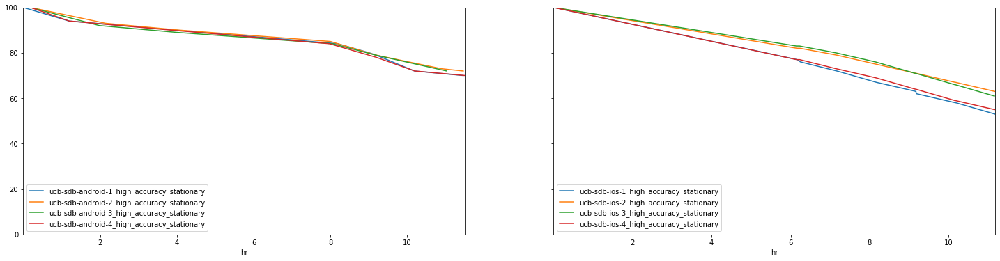

In [10]:
(ifig, [android_ax, ios_ax]) = plt.subplots(ncols=2, nrows=1, figsize=(25,6))

ezpv.plot_all_power_drain(ios_ax, pvt3.map()["ios"], "calibration", "stationary")
# ios_ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ezpv.plot_all_power_drain(android_ax, pvt3.map()["android"], "calibration", "stationary")
# android_ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))

#### Second experiment (multiple runs)

Since this was surprising, I decided to run the experiments multiple times to try and avoid noise. The results are shown below. There is clearly a greater variation in the iOS case than the android case; I am not sure if it can be controlled any better. We may just need to work with higher tolerances on iOS. This also indicates several issues that need to be addressed in the next round.

##### Issue #2: Medium accuracy on iOS

The iOS accuracy levels are defined (as CLLocationAccuracy constants) [https://developer.apple.com/documentation/corelocation/cllocationaccuracy?language=objc]
Based on the list, I picked high accuracy = `kCLLocationAccuracyBest` and medium accuracy = `kCLLocationAccuracyNearestTenMeters`. However, at least in our testing, there was no significant difference in power drain between the two options. We will see later that there doesn't appear to be a significant difference in accuracy either. The option which really separated from the curve was `kCLLocationAccuracyHundredMeters` which I had mapped to low accuracy. In the next round, I need to switch medium accuracy = `kCLLocationAccuracyHundredMeters` and low accuracy = `kCLLocationAccuracyKilometer`?

##### Issue #3: Built-in duty cycling on android

It appears that android has some form of built-in duty cycling in high accuracy mode, where the power drain slope abruptly changes around 2 hours. We will see some additional evidence of this later. After 2.5 hours, the slope appears to be more similar to medium accuracy. There does not appear to be such a knee during medium accuracy collection.

##### Issue #4: Unexpected and unexplained move out of duty cycling on android

This only happened once, but it looks like one phone moved back into the active state during one run causing a second clear increase in slope at around 12.5 hours. We will see additional evidence for this later as well. It is not clear what caused this to happen, and it is also not clear why the others did not follow suit. Such idiosyncracies could complicate efforts to observe power drain during evaluation.

##### Issue #5: Representing multiple runs

This is more of a UI issue, but the current version of the UI did not allow for more than one full screen of calibration options. This meant that we could only see one low accuracy option, which is why we have limited low accuracy data. We need to figure out how best to represent this - allow the UI to display more options? separate the run from the calibration option? both?

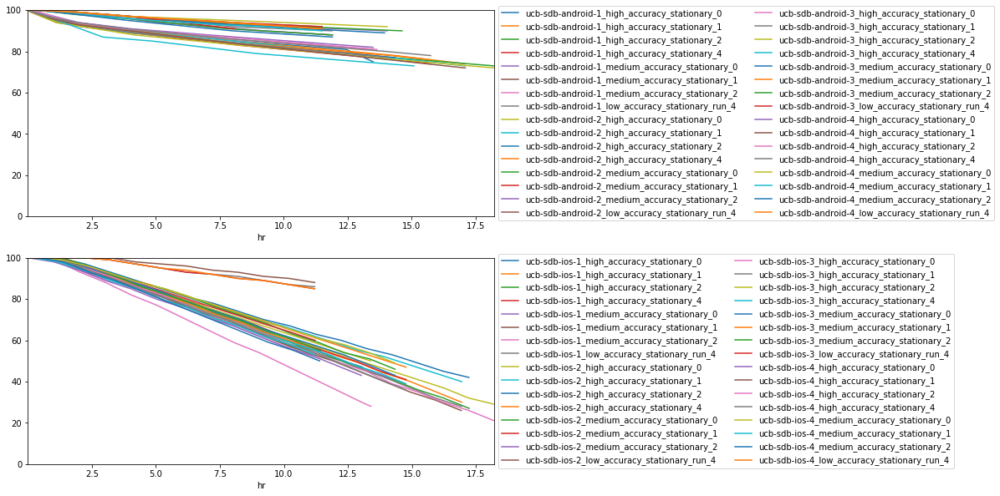

In [11]:
(ifig, [android_ax, ios_ax]) = plt.subplots(ncols=1, nrows=2, figsize=(10,10))

ezpv.plot_all_power_drain(ios_ax, pv_ca_only.map()["ios"], "calibration", "stationary")
ios_ax.legend(loc="center left", bbox_to_anchor=(1, 0.5), ncol=2)
ezpv.plot_all_power_drain(android_ax, pv_ca_only.map()["android"], "calibration", "stationary")
android_ax.legend(loc="center left", bbox_to_anchor=(1, 0.5), ncol=2)

#### Recap of the issues with another view

This other view displays the plots for each phone over multiple runs. This highlights the previous issues again:
- medium accuracy and high accuracy on iOS are almost identical, low accuracy is significantly different
- the duty cycling for `high-accuracy-stationary-4` on `ucb-sdb-android-3` is very clear and is different from the others
- for `high-accuracy-stationary-0` on `ucb-sdb-android-1`, there are two discontinuities - the second one, around 12.5 hours sharply increases the power drain
- the `high-accuracy-stationary-0` run on `ucb-sdb-ios-3`, the `medium-accuracy-stationary-0` run on `ucb-sdb-ios-4` are significantly different from the others. The first is an outlier even in the aggregate (see above), the second is only an outlier for this phone.

Printing 1 nRows for calibration, pattern stationary
Printing 1 nRows for calibration, pattern stationary


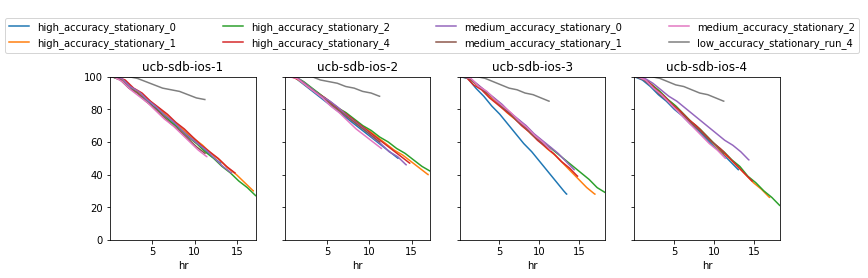

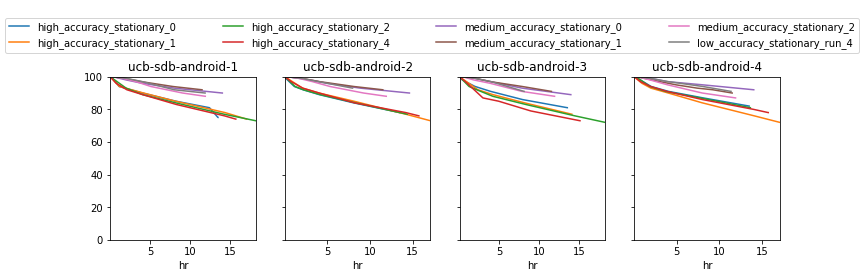

In [12]:
(ifig, ax) = plt.subplots(figsize=(12,3), nrows=0, ncols=0)
ezpv.plot_separate_power_drain(ifig, pv_ca_only.map()["ios"], 4, "calibration", "stationary")
(ifig, ax) = plt.subplots(figsize=(12,3), nrows=0, ncols=0)
ezpv.plot_separate_power_drain(ifig, pv_ca_only.map()["android"], 4, "calibration", "stationary")

### Battery drain over time (moving calibration)

The moving calibration runs were not very useful in terms of battery drain, since there were too few points to be useful. Part of this is inherent in the definition of moving calibration, since it is unlikely that we will move for 10-15 hours at a time to collect the kind of data we have in the stationary case. And if our trip lasts for an hour, but we only read the battery level once an hour, we will end up with close to no data.

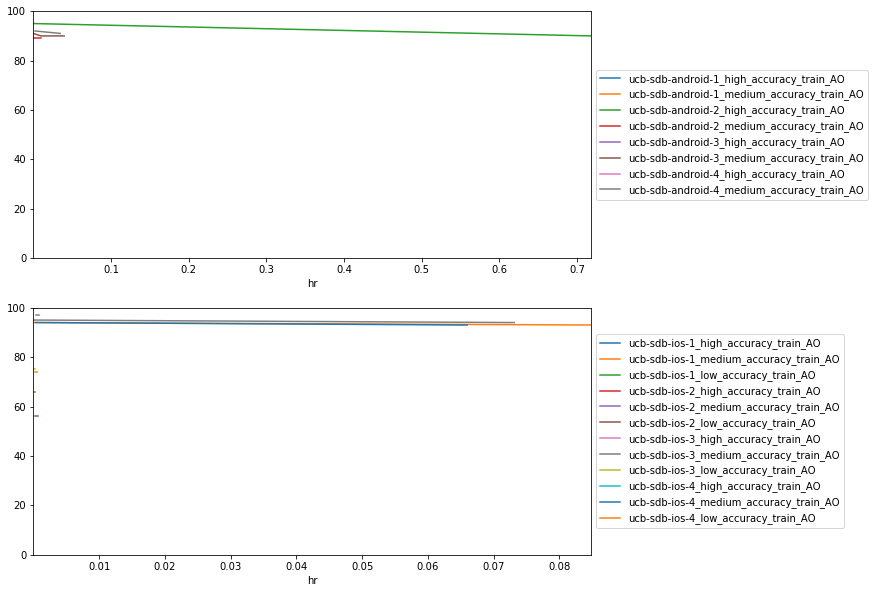

In [13]:
(ifig, [android_ax, ios_ax]) = plt.subplots(ncols=1, nrows=2, figsize=(10,10))

ezpv.plot_all_power_drain(ios_ax, pvt3.map()["ios"], "calibration", "AO")
ios_ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ezpv.plot_all_power_drain(android_ax, pvt3.map()["android"], "calibration", "AO")
android_ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))

### Checking counts (stationary)

We now check the number of data points collected during calibration and their distribution in an effort to validate the duty cycling. Observations from this are:

##### on android: more points = more power drain

As we would expect, the number of points across the various phones and the various runs is almost identical. In the cases where it is significantly different (e.g. `high-accuracy-stationary-0` on `ucb-sdb-android-1` and `high-accuracy-stationary-3` on `ucb-sdb-android-3`), we have see significant differences in the power drain as well. However, we do not understand why these two runs behave differently from the other runs.

##### on iOS: almost no points

Since iOS has a distance filter, and not a time filter, and this calibration was stationary, almost no points are generated for high accuracy sensing. However, with low accuracy sensing (which is actually medium accuracy), we do get a significant number of points (an order of magnitude more), although nowhere near the number of entries on android.

##### on android: medium accuracy = almost no points

On android, medium accuracy sensing generates two orders of magnitude fewer points than high accuracy. So the additional power drain on android probably reflects not just the sensing cost but also the processing cost. This also indicates that the medium accuracy sensing, which relies on WiFi and cellular signal strengths, is likely to be suspended when the phone is in doze mode, and is consistent with prior observed behavior.

In [14]:
count_df = ezpv.get_count_df(pv_ca_only); count_df

Processing data for android phones
Processing data for ios phones


,high_accuracy_stationary_0,high_accuracy_stationary_1,high_accuracy_stationary_2,high_accuracy_stationary_4,low_accuracy_stationary_run_4,medium_accuracy_stationary_0,medium_accuracy_stationary_1,medium_accuracy_stationary_2
android_ucb-sdb-android-1,9848,6615,6065,7661,65,82,67,93
android_ucb-sdb-android-2,6096,6853,6801,6801,57,90,65,116
android_ucb-sdb-android-3,5206,6788,7385,10527,68,64,59,69
android_ucb-sdb-android-4,5504,6572,5723,6488,88,73,127,72
ios_ucb-sdb-ios-1,8,18,11,13,192,18,15,19
ios_ucb-sdb-ios-2,13,13,13,10,319,8,15,11
ios_ucb-sdb-ios-3,16,28,10,12,418,12,12,10
ios_ucb-sdb-ios-4,15,13,30,14,292,84,11,16


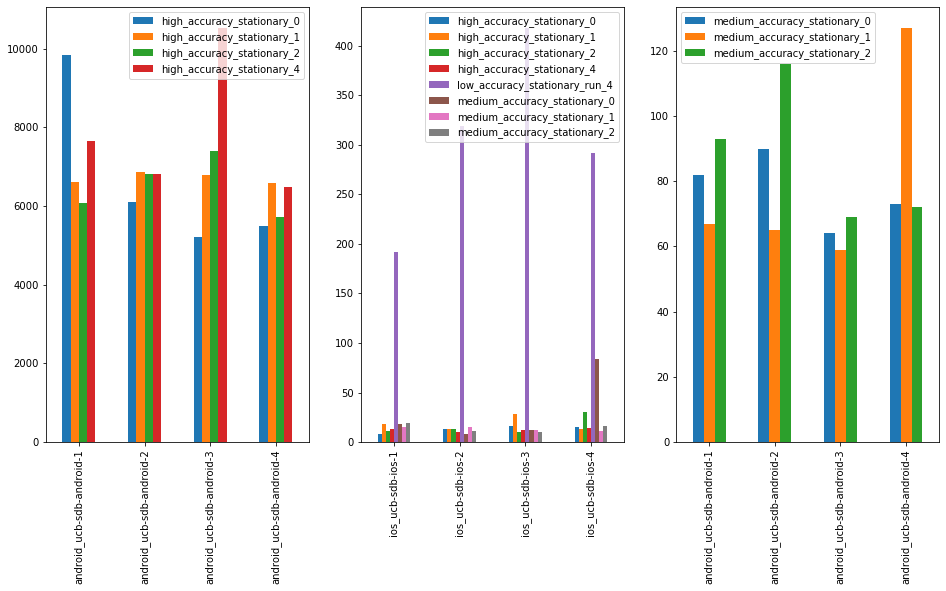

In [15]:
(ifig, ax) = plt.subplots(nrows=1, ncols=3, figsize=(16,8))
count_df.filter(like="high_accuracy").filter(like="android", axis=0).plot(ax=ax[0],kind="bar")
count_df.filter(like="ios", axis=0).plot(ax=ax[1],kind="bar")
count_df.filter(like="medium_accuracy").filter(like="android", axis=0).plot(ax=ax[2],kind="bar")

### Checking counts (moving)

Although the battery drain is not significant while moving, the counts are likely to be much more relevant, specially in the iOS case, with the distance filter.

##### on iOS: significant number of points

Since iOS has a distance filter, we finally have a reasonable set of location points for both platforms. The number of points on iOS is still consistently lower than the corresponding count on android

##### on iOS: medium accuracy is consistently lower than high accuracy

Recall that the "medium" accuracy here is `kCLLocationAccuracyNearestTenMeters` which did not have a significantly different power drain than `kCLLocationAccuracyBest`. However, the number of points is much lower when this medium accuracy is selected.

##### on android: medium accuracy = significant number of points, but lower

On android, medium accuracy sensing now generates ~ 0.5 * the number of points with high accuracy, but the medium accuracy numbers are consistently lower than the high accuracy.

In [16]:
count_df = ezpv.get_count_df(pvt3); count_df.filter(like="AO")

Processing data for android phones
Processing data for ios phones


,high_accuracy_train_AO,low_accuracy_train_AO,medium_accuracy_train_AO
android_ucb-sdb-android-1,2090.0,NaN,1033.0
android_ucb-sdb-android-2,3188.0,NaN,1149.0
android_ucb-sdb-android-3,3200.0,NaN,1513.0
android_ucb-sdb-android-4,2290.0,NaN,1051.0
ios_ucb-sdb-ios-1,1099.0,153.0,894.0
ios_ucb-sdb-ios-2,1458.0,26.0,980.0
ios_ucb-sdb-ios-3,2067.0,108.0,1034.0
ios_ucb-sdb-ios-4,2182.0,133.0,1074.0


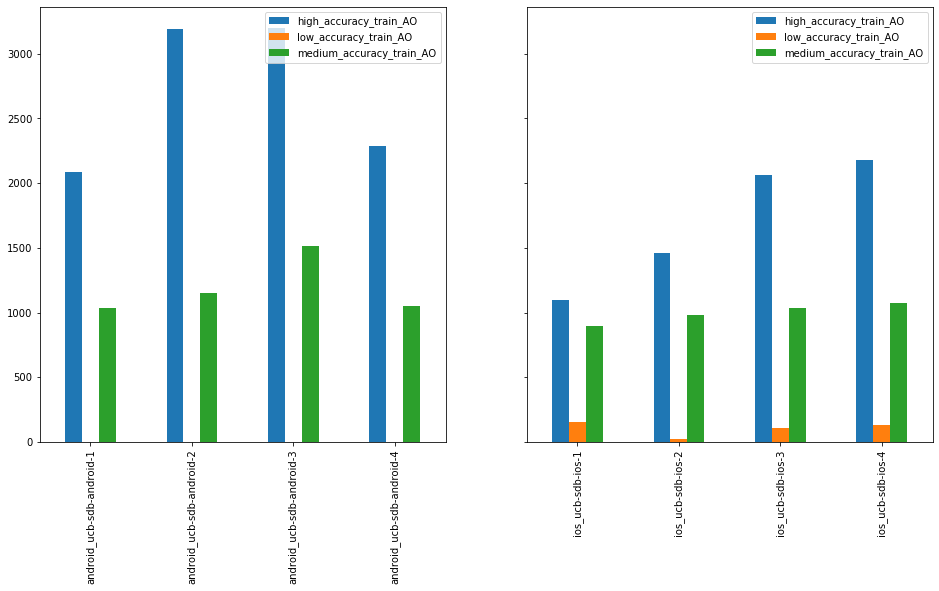

In [17]:
(ifig, ax) = plt.subplots(nrows=1, ncols=2, figsize=(16,8), sharey=True)
count_df.filter(like="AO").filter(like="android", axis=0).plot(ax=ax[0],kind="bar")
count_df.filter(like="AO").filter(like="ios", axis=0).plot(ax=ax[1],kind="bar")

### Checking densities (stationary)

Density checks don't make as much sense on iOS, since there are so few entries, so we will focus mainly on android.

##### on android: duty cycling = density variation

In general, most of the android points are sensed right after the calibration starts, at around zero. There are also a couple of minor bumps around hours 2, 6 and 15. This seems consistent with the explanation of doze mode, in which the phone goes into a lower power state when not in use and wakes up at increasing intervals. The exceptions are `high-accuracy-stationary-1` on `ucb-sdb-android-1`, which corresponds to the abrupt increase in power drain seen in the power curves. There is also a somewhat unusual bump related to `low-accuracy-stationary-4` on `ucb-sdb-android-4` but probably because the accuracy is already low, and the bump is small, we do not see a visible difference in slope for that curve.

5264
Printing 1 nRows for calibration, pattern stationary


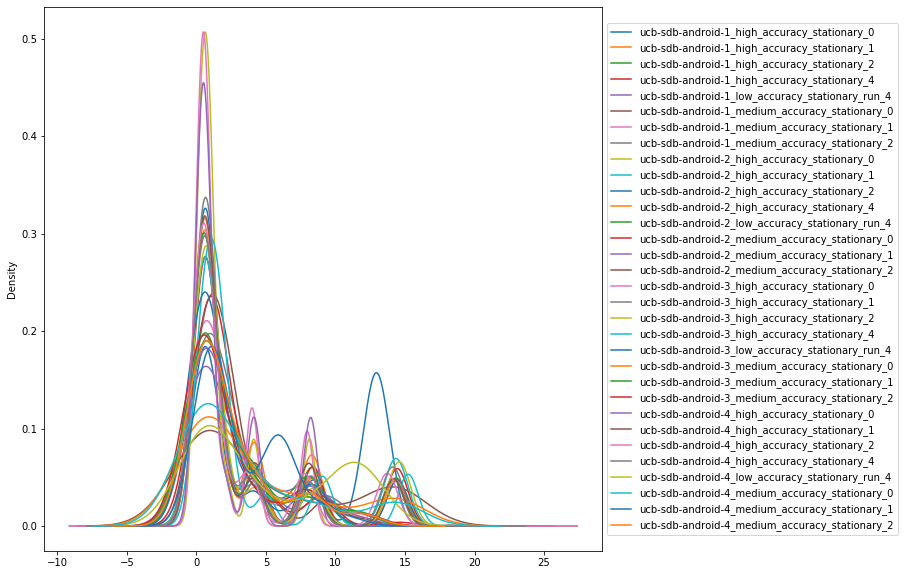

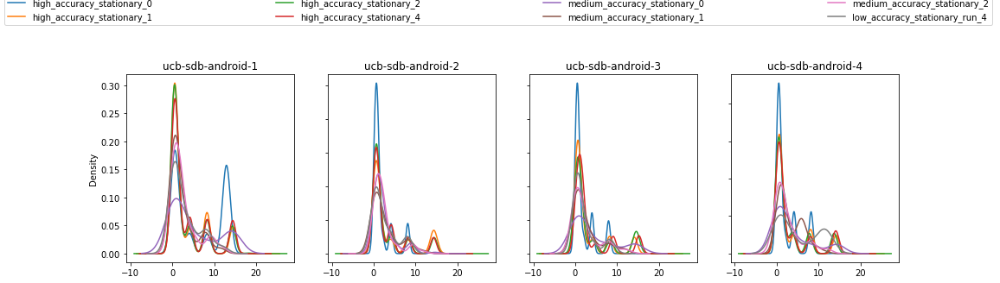

In [18]:
android_density_df = ezpv.get_location_density_df(pv_ca_only.map()["android"])
nRows = ezpv.get_row_count(len(android_density_df), 2)
print(nRows)
android_ax = android_density_df.plot(kind='density', subplots=False, layout=(nRows, 2), figsize=(10,10), sharex=True, sharey=True)
android_ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))

(ifig, ax) = plt.subplots(figsize=(16,4), nrows=0, ncols=0)
ezpv.plot_separate_density_curves(ifig, pv_ca_only.map()["android"], 4, "calibration", "stationary")

### Checking densities (moving)

As expected, when moving, while the densities do vary, they do not show the kind of spiky behavior that we see while stationary. Instead, we get points pretty much throughout the travel time.

6399
1091


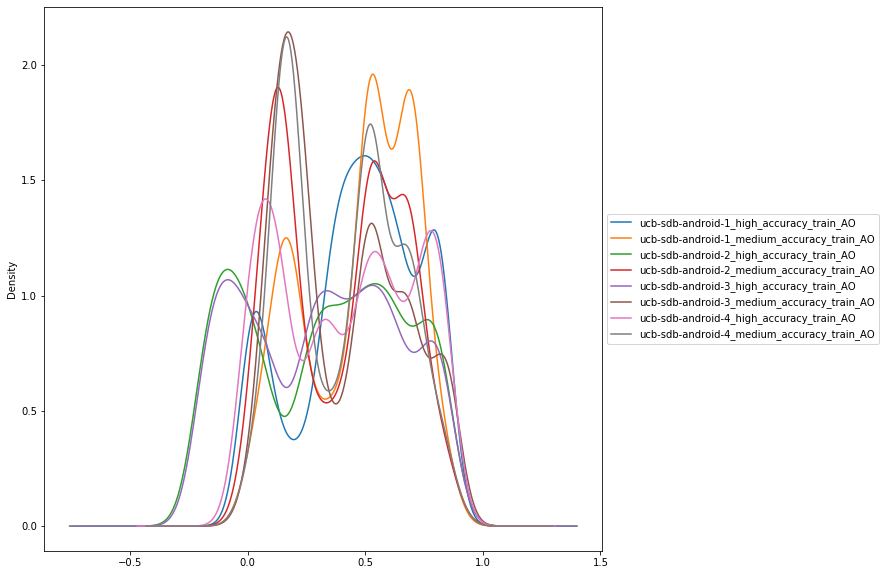

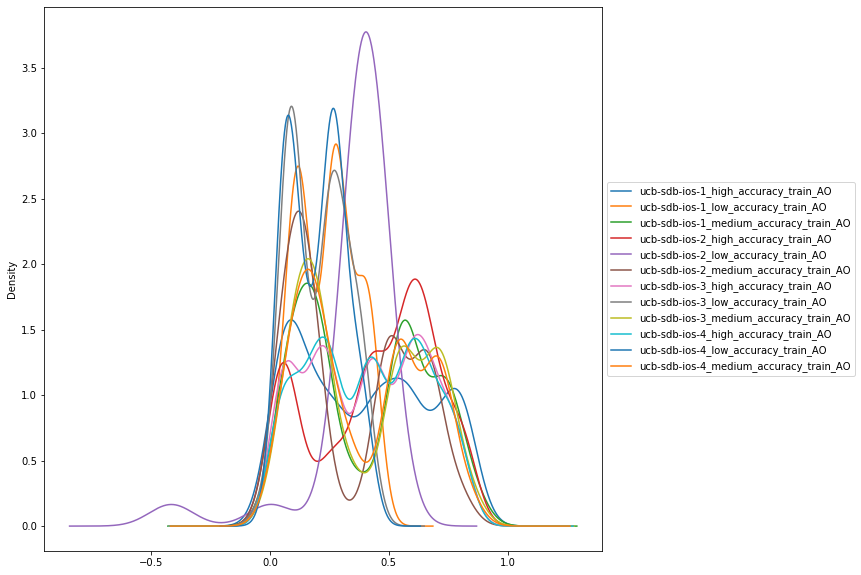

In [19]:
android_density_df = ezpv.get_location_density_df(pvt3.map()["android"])
nRows = ezpv.get_row_count(len(android_density_df), 2)
print(nRows)
android_ax = android_density_df.filter(like="AO").plot(kind='density', subplots=False, layout=(nRows, 2), figsize=(10,10), sharex=True, sharey=True)
android_ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))

ios_density_df = ezpv.get_location_density_df(pvt3.map()["ios"])
nRows = ezpv.get_row_count(len(ios_density_df), 2)
print(nRows)
ios_ax = ios_density_df.filter(like="AO").plot(kind='density', subplots=False, layout=(nRows, 2), figsize=(10,10), sharex=True, sharey=True)
ios_ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))

### Checking trajectories (stationary)

While checking the counts and densities, we looked at the location sensing data **over time**. We can also look at it **over space**, by displaying it on a map. At this point, stationary data is less interesting because we basically expect it to be concenrated around a single location. However, on visualizing it, we can see some unexpected behavior.

##### on all phones: there are unexpected jumps

Even in the case of high accuracy sensing, on both android and iOS, we see jumps from the stationary location. These jumps are particularly pronounced in `ucb-sdb-android-2_medium_accuracy_stationary_2`, `ucb-sdb-ios-1_low_accuracy_stationary_4`, where they cover 5-6 blocks, but we can see at least one block displacements in a bunch of other maps (e.g. `ucb-sdb-ios-2_high_accuracy_stationary_1`)

##### on android: low accuracy really sucks

The low accuracy option on android jumps all over the map in a very distinctive zig-zag pattern

In [20]:
ha_map_list = ezpv.get_map_list(pv_ca_only, "calibration", "")
ha_map_list.extend(ezpv.get_map_list(pvt3, "calibration", "stationary"))
rows = ezpv.get_row_count(len(ha_map_list), 8)
evaluation_maps = bre.Figure(ratio="{}%".format((rows/4) * 100))
for i, curr_map in enumerate(ha_map_list):
    evaluation_maps.add_subplot(rows, 8, i+1).add_child(curr_map)

Processing data for android phones
[[37.390927300000001, -122.08653320000001], [37.391119600000003, -122.0864067]]
midpoint = 37.3909273, -122.08646995, plotting at 37.3909273, -122.08646995
[[37.390853999999997, -122.086584], [37.391091600000003, -122.086294]]
midpoint = 37.390854, -122.086439, plotting at 37.390854, -122.086439
[[37.390984600000003, -122.08664280000001], [37.391107499999997, -122.0863166]]
midpoint = 37.3909846, -122.0864797, plotting at 37.3909846, -122.0864797
[[37.390921599999999, -122.0865326], [37.391058200000003, -122.08636079999999]]
midpoint = 37.3909216, -122.0864467, plotting at 37.3909216, -122.0864467
[[37.390953199999998, -122.086506], [37.3910482, -122.0863684]]
midpoint = 37.3909532, -122.0864372, plotting at 37.3909532, -122.0864372
[[37.391045699999999, -122.0864608], [37.391056200000001, -122.08645319999999]]
midpoint = 37.3910457, -122.086457, plotting at 37.3910457, -122.086457
[[37.391041700000002, -122.0864964], [37.391088699999997, -122.0864527

In [21]:
evaluation_maps

### Checking trajectories (moving)

As expected, these are more interesting than the stationary trajectories. Some observations:
- the high accuracy trajectories look reasonably good, but the medium accuracy trajectories on android have significant zig zags

- the iOS medium accuracy trajectories look really good in comparison, but note that in this run, "medium accuracy" seems to incur a power drain close to high accuracy. We need to retry with the medium accuracy set to low accuracy (issue already identified)

In [22]:
ha_map_list = ezpv.get_map_list(pvt3, "calibration", "AO")
rows = ezpv.get_row_count(len(ha_map_list), 8)
evaluation_maps = bre.Figure(ratio="{}%".format((rows/4) * 100))
for i, curr_map in enumerate(ha_map_list):
    evaluation_maps.add_subplot(rows, 8, i+1).add_child(curr_map)

Processing data for android phones
[[37.394654699999997, -122.4139248], [37.776583199999997, -122.0763895]]
midpoint = 37.3946547, -122.24515715, plotting at 37.3946547, -122.24515715
[[37.775975799999998, -122.4115489], [37.8703067, -122.26618013]]
midpoint = 37.7759758, -122.338864515, plotting at 37.7759758, -122.338864515
[[37.390684200000003, -122.4132675], [37.776392299999998, -122.076334]]
midpoint = 37.3906842, -122.24480075, plotting at 37.3906842, -122.24480075
[[37.775872939999999, -122.41733360000001], [37.870133199999998, -122.2659345]]
midpoint = 37.77587294, -122.34163405, plotting at 37.77587294, -122.34163405
[[37.3907095, -122.4131345], [37.776415999999998, -122.07620350000001]]
midpoint = 37.3907095, -122.244669, plotting at 37.3907095, -122.244669
[[37.776026199999997, -122.4115489], [37.870683849999999, -122.2646373]]
midpoint = 37.7760262, -122.3380931, plotting at 37.7760262, -122.3380931
[[37.394593899999997, -122.41328249999999], [37.776433099999998, -122.07632

In [23]:
evaluation_maps

## Now for the results (calibration, evaluation view)!

### Trajectory matching

In the phone view, we were able to compare phone results against each other (e.g. `ucb-sdb-android-1` v/s `ucb-sdb-android-2` for the same run) by plotting them on the same graph. We need something similar for trajectories, so that we can get a better direct comparison against various configurations. To make this easier, we want to switch the view so that the calibration ranges are first grouped by the settings and then by the phone. Once we do that, we can compare trajectories from different phones for the same experiment in the same map.

##### Issue #1: No matching with ground truth

Zooming into the maps, we can see that even in the high accuracy case, there are mismatches between the trajectories. For example, the iOS high accuracy maps between South San Francisco and San Francisco, android medium accuracy maps between SF and the Easy Bay. Even if the trajectories match, they don't necessarily match with the ground truth, for example, the android high accuracy maps between 22nd street and 4th and King, iOS medium accuracy right after reaching Oakland. We should extend the spec to support this.

In [24]:
map_list = ezev.get_map_list_single_run(evt3, "calibration", "AO")
rows = ezpv.get_row_count(len(map_list), 2)
evaluation_maps = bre.Figure(ratio="{}%".format((rows/4) * 100))
for i, curr_map in enumerate(map_list):
    evaluation_maps.add_subplot(rows, 2, i+1).add_child(curr_map)

Processing data for android phones
curr_calibrate = high_accuracy_stationary, not matching pattern AO, skipping
0, ucb-sdb-android-1, dict_keys(['trip_id', 'start_ts', 'end_ts', 'duration', 'battery_entries', 'battery_df', 'location_entries', 'location_df', 'motion_activity_entries', 'motion_activity_df'])
Processing high_accuracy_train_AO, ucb-sdb-android-1, found 2090 locations, adding to map
1, ucb-sdb-android-2, dict_keys(['trip_id', 'start_ts', 'end_ts', 'duration', 'battery_entries', 'battery_df', 'location_entries', 'location_df', 'motion_activity_entries', 'motion_activity_df'])
Processing high_accuracy_train_AO, ucb-sdb-android-2, found 3188 locations, adding to map
2, ucb-sdb-android-3, dict_keys(['trip_id', 'start_ts', 'end_ts', 'duration', 'battery_entries', 'battery_df', 'location_entries', 'location_df', 'motion_activity_entries', 'motion_activity_df'])
Processing high_accuracy_train_AO, ucb-sdb-android-3, found 3200 locations, adding to map
3, ucb-sdb-android-4, dict_key

In [25]:
evaluation_maps

### Battery drain (stationary)

This is less important since the plots with all curves do allow for direct comparisons between the battery drain curves across multiple phones. But just for the record, let us generate subplots that are grouped by run instead of by phone.

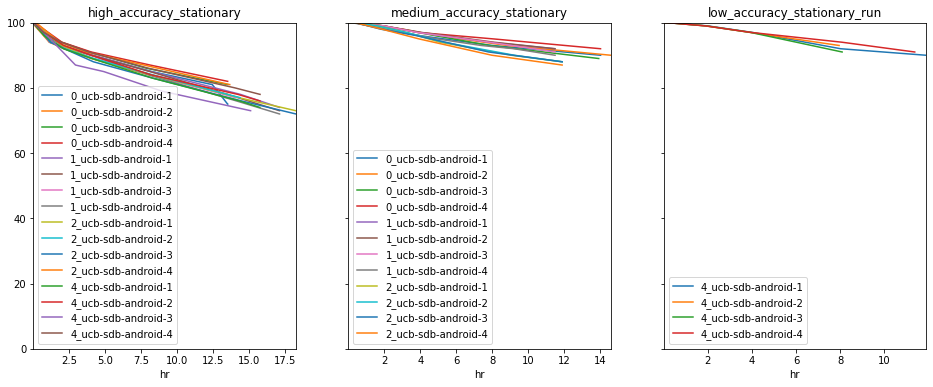

In [26]:
(ifig, ax) = plt.subplots(figsize=(16,6),nrows=0,ncols=0)
ezev.plot_separate_power_drain_multiple_runs(ifig, 3, ev_ca_only.map("calibration")["android"], "")

## Now for the results (evaluation, evaluation view)!

### Trajectory matching

Finally, we get to the evaluation, in which we run different regimes across the different phones. We also have pre-determined ground truth for the trips. Since our entire goal is to compare the trips against each other, we will go directly to the evaluation view.


##### Issue #1: Tracking not turned off for the power control

We can see that the power control also has location entries. This is because, even in the case of the power control, although we were setting the accuracy to the lowest possible and also sampling at a very low rate, we were not turning tracking off. We need to fix this.

In [27]:
evt3.map("evaluation")["android"]["HAHFDC v/s HAMFDC"]["short_walk_suburb"]["power_control"]["location_df"]

,accuracy,altitude,bearing,elapsedRealtimeNanos,filter,fmt_time,latitude,longitude,sensed_speed,ts,hr
3,104.100,0.0,0.0,1177679700000000,time,"Jun 19, 2019 2:12:54 PM",37.388647,-122.087248,0,1.560979e+09,0.170296
4,104.100,0.0,0.0,1177679700000000,time,"Jun 19, 2019 2:12:54 PM",37.388647,-122.087248,0,1.560979e+09,0.170296
5,31.184,-2.4,0.0,1177755377000000,time,"Jun 19, 2019 2:14:09 PM",37.389891,-122.085360,0,1.560979e+09,0.191317
6,28.162,0.4,0.0,1177820381000000,time,"Jun 19, 2019 2:15:14 PM",37.389054,-122.084717,0,1.560979e+09,0.209374
7,22.192,0.1,0.0,1177884399000000,time,"Jun 19, 2019 2:16:18 PM",37.388897,-122.083816,0,1.560979e+09,0.227157
8,24.553,-0.6,0.0,1178003572000000,time,"Jun 19, 2019 2:18:17 PM",37.388406,-122.082308,0,1.560979e+09,0.260260
9,40.249,0.0,0.0,1178164635000000,time,"Jun 19, 2019 2:20:59 PM",37.390295,-122.081448,0,1.560979e+09,0.305000
10,405.907,0.0,0.0,1178408407000000,time,"Jun 19, 2019 2:25:02 PM",37.390295,-122.081448,0,1.560980e+09,0.372714
11,15.670,0.0,0.0,1178651406000000,time,"Jun 19, 2019 2:29:05 PM",37.388354,-122.075817,0,1.560980e+09,0.440214
12,16.481,0.0,0.0,1178889403000000,time,"Jun 19, 2019 2:33:03 PM",37.387193,-122.073231,0,1.560980e+09,0.506324


### Other observations include:
- The trajectory lines all match up pretty well, but that is not surprising since this was a high accuracy v/s high accuracy comparison, with only the filter being different
- The android evaluation phones ran out of battery before the second set of trips, so we only have the accuracy control for the `short_car_suburb` and `short_car_suburb_freeway`
- There is a clear zigzag in the android `short_bike_suburb` case
- The gap between the actual start of the trip and the detected start of the trip is much larger on iOS (~ 3-4 blocks) than android (~ 1-2 blocks)

In [28]:
map_list = ezev.get_map_list_eval_trips(evt3, "evaluation", "AO")
rows = ezpv.get_row_count(len(map_list), 2)
evaluation_maps = bre.Figure(ratio="{}%".format((rows/4) * 100))
for i, curr_map in enumerate(map_list):
    evaluation_maps.add_subplot(rows, 2, i+1).add_child(curr_map)

Processing data for android phones
Processing HAHFDC v/s HAMFDC, short_walk_suburb, accuracy_control, found 2159 locations, adding to map
Processing HAHFDC v/s HAMFDC, short_walk_suburb, HAHFDC, found 1857 locations, adding to map
Processing HAHFDC v/s HAMFDC, short_walk_suburb, HAMFDC, found 1843 locations, adding to map
Skipping the last item (power_control)
[[37.386157400000002, -122.08668489999999], [37.390938900000002, -122.0695116]]
for trip short_walk_suburb with 5859 points, midpoint = 37.3861574, -122.07809825, plotting at 37.3861574, -122.07809825
Processing HAHFDC v/s HAMFDC, short_bike_suburb, accuracy_control, found 622 locations, adding to map
Processing HAHFDC v/s HAMFDC, short_bike_suburb, HAHFDC, found 1248 locations, adding to map
Processing HAHFDC v/s HAMFDC, short_bike_suburb, HAMFDC, found 1248 locations, adding to map
Skipping the last item (power_control)
[[37.386254299999997, -122.08663989999999], [37.391021000000002, -122.06947580000001]]
for trip short_bike_su

In [29]:
evaluation_maps

### Investigating android evaluation power drain

The android evaluation power drain is surprising. We would expect power drain of the evaluation (which duty cycles the sensing) to be much lower than the accuracy control, which senses continuously. However, both the evaluation phones ran out of battery before the second trip, and the accuracy control did not. Let's verify this from the battery drain.

We know that individual trip power drains will not tell us much because of the short durations. But the range-specific tracking should have some values...

Aha! We can see that the duty cycling works as expected on iOS. The power drain of both regimes is almost identical to the power control, although we would expect the power control to get even lower when we actually stop tracking. However, on android, the evaluation regimes are in fact almost identical and with a much higher drain than the accuracy control.

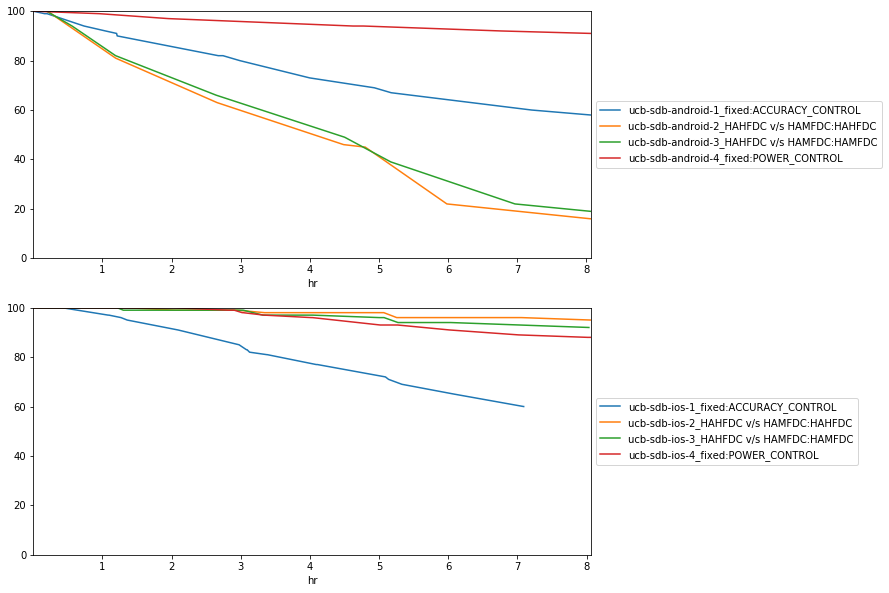

In [30]:
(ifig, [android_ax, ios_ax]) = plt.subplots(ncols=1, nrows=2, figsize=(10,10))

ezpv.plot_all_power_drain(ios_ax, pvt3.map()["ios"], "evaluation", "")
ios_ax.legend(loc="center left", bbox_to_anchor=(1, 0.5), ncol=1)
ezpv.plot_all_power_drain(android_ax, pvt3.map()["android"], "evaluation", "")
android_ax.legend(loc="center left", bbox_to_anchor=(1, 0.5), ncol=1)

##### Issue #1: Milliseconds?

Investigating this further by viewing the logs on the phone, we realize that we configure the android filter_time with the value of the filter directly. e.g. if filter = 1, then filter_time = 1. However, the API expects the time in milliseconds, so we are effectively setting this to 1 millisecond, not one second. Since the minimum filter_time is 1 second, this ensures that:
- we get data every second in all the regimes (see plots below)
- the HAHFDC and HAMFDC are effectively the same
- the number of entries that we need to find before we detect the trip end is in the tens of thousands. We don't actually achieve this number, so we keep sensing anyway, so we never actually duty cycle (see transition list below)

But why are they **worse** than the accuracy control? Given that the sensing is largely identical, this **must be** due to the additional processing of iterating over all the entries to determine whether the trip has ended. So there really does appear to be a tradeoff between lower sensing and more local computation in the duty cycling case, specially for CPU-hungry phones. We might want to experiment further with this.

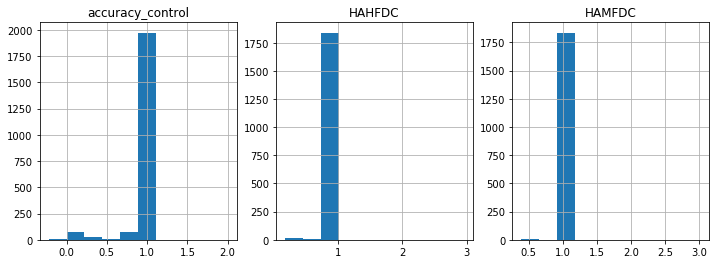

In [31]:
test_eval_range = evt3.map("evaluation")["android"]["HAHFDC v/s HAMFDC"]
(ifig, ax_list) = plt.subplots(ncols=3, nrows=1, figsize=(12,4))

for i, (regime, regime_map) in enumerate(test_eval_range["short_walk_suburb"].items()):
    if i == 3:
        continue
    regime_map["location_df"].ts.diff().hist(ax=ax_list[i], label=regime)

    ax_list[i].set_title(regime)

In [32]:
import arrow

test_transition_phone = "ucb-sdb-android-2"
test_eval_range = pvt3.map()["android"][test_transition_phone]["evaluation_ranges"][0]
transition_entries = pvt3.spec_details.retrieve_data_from_server(test_transition_phone, ["statemachine/transition"], test_eval_range["start_ts"], test_eval_range["end_ts"])
print("\n".join([str((t["data"]["transition"], t["data"]["ts"], arrow.get(t["data"]["ts"]).to(pvt3.spec_details.eval_tz))) for t in transition_entries]))

About to retrieve messages using {'user': 'ucb-sdb-android-2', 'key_list': ['statemachine/transition'], 'start_time': 1560978066, 'end_time': 1561007085}
response = <Response [200]>
Found 4 entries
('local.transition.stop_tracking', 1560978066.837, <Arrow [2019-06-19T14:01:06.837000-07:00]>)
('local.transition.start_tracking', 1560978067.781, <Arrow [2019-06-19T14:01:07.781000-07:00]>)
('local.transition.initialize', 1560978068.016, <Arrow [2019-06-19T14:01:08.016000-07:00]>)
('local.transition.exited_geofence', 1560978801.731, <Arrow [2019-06-19T14:13:21.731000-07:00]>)


### Checking the motion activity

In addition to location data, we also read the motion_activity data from the closed source phone APIs. Let's quickly check how accurate the raw motion activity is.

The medium accuracy runs seem to be much more noisy wrt motion activity transitions. We should really not get a lot of transitions since we essentially took various trains for the entire route. The high accuracy sensing seems to be largely stable, except for one extraneous transition in the middle of the `ucb-sdb-ios-1` run.

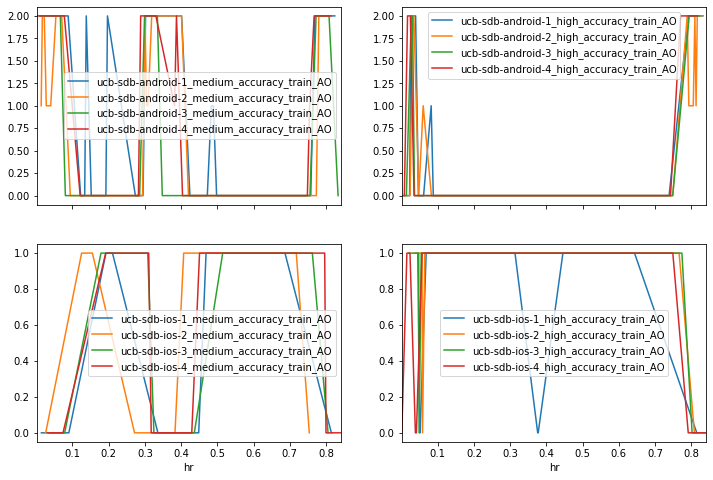

In [33]:
(ifig, ax) = plt.subplots(nrows=2, ncols=2, figsize=(12,8), sharex=True)
ezpv.display_unprocessed_android_activity_transitions(pvt3, ax[0][0], "calibration", "medium_accuracy_train_AO")
ezpv.display_unprocessed_android_activity_transitions(pvt3, ax[0][1], "calibration", "high_accuracy_train_AO")
ezpv.display_unprocessed_ios_activity_transitions(pvt3, ax[1][0], "calibration", "medium_accuracy_train_AO")
ezpv.display_unprocessed_ios_activity_transitions(pvt3, ax[1][1], "calibration", "high_accuracy_train_AO")
plt.legend()